In [6]:
# !pip install opencv-python

     |████████████████████████████████| 45.9 MB 2.8 MB/s eta 0:00:01


In [29]:
import requests
from IPython.display import Image
import numpy as np
import cv2
from keras.datasets import mnist
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

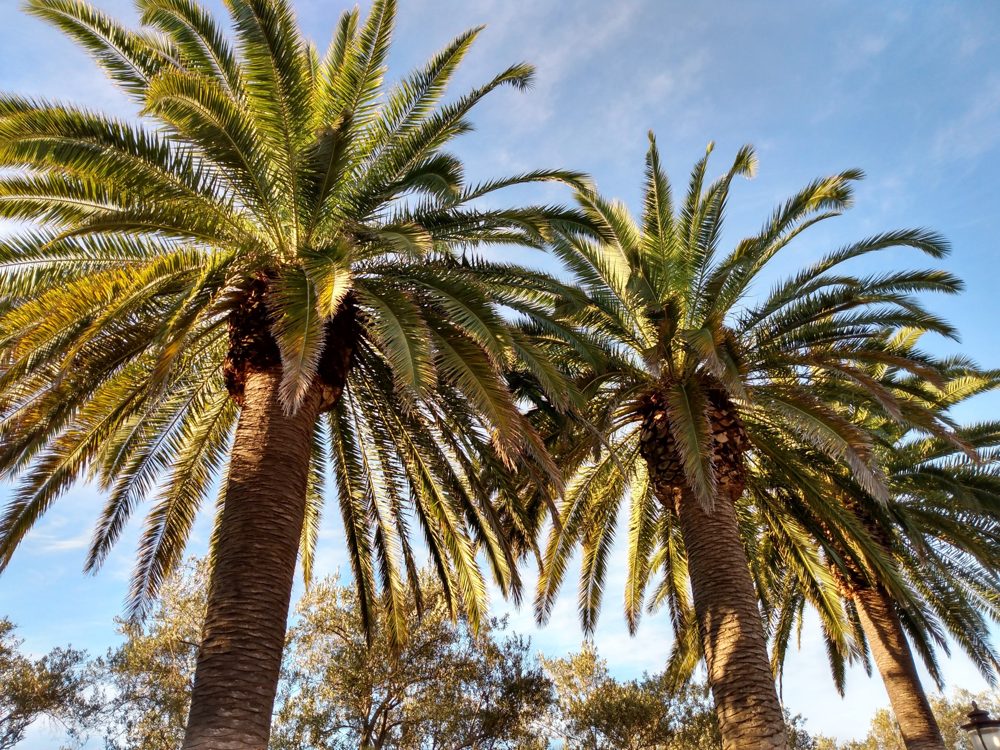

In [4]:
img_url = "https://raw.githubusercontent.com/bloominstituteoftechnology/data-science-canvas-images/main/unit_4/palm_trees.jpg"

r = requests.get(img_url)
with open('palm_trees.jpg', 'wb') as f:
    f.write(r.content)

Image(filename='palm_trees.jpg', width=500)

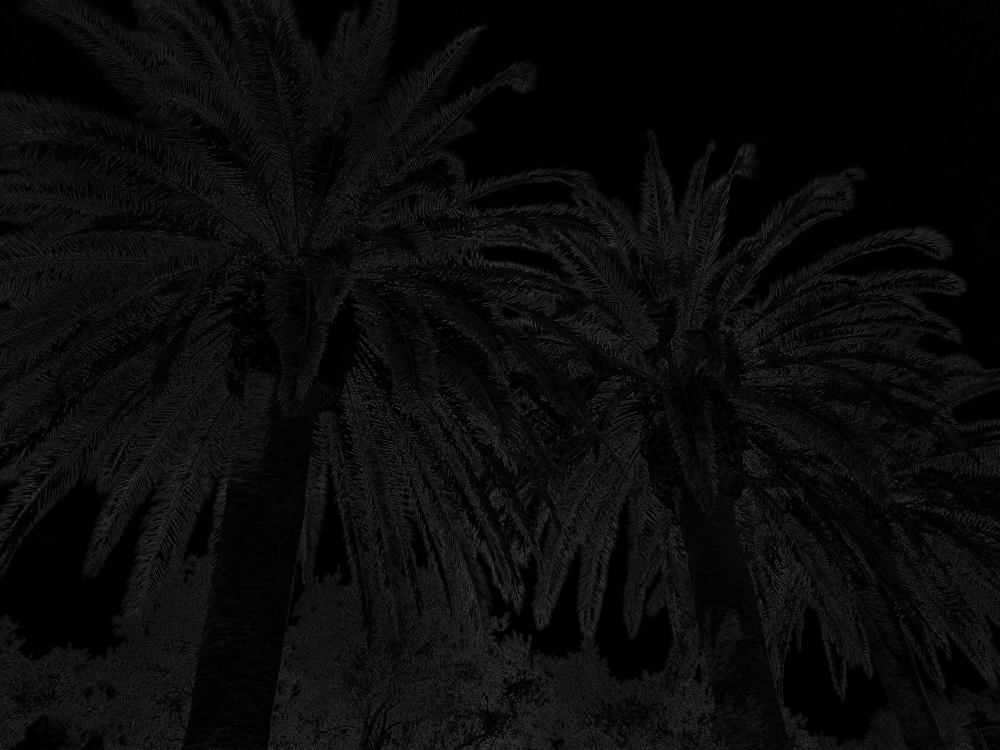

In [8]:
img_src = cv2.imread('palm_trees.jpg')

# edge detection(high-pass filter)
kernel = np.array([[0.0, -1.0, 0.0],
                   [-1.0, 4.0, -1.0],
                   [0.0, -1.0, 0.0]])

kernel = kernel / (np.sum(kernel) if np.sum(kernel) !=0 else 1)

# filter source img
img_rst = cv2.filter2D(img_src, -1, kernel)

# save result image
cv2.imwrite('palm_trees_edge.jpg', img_rst)

Image(filename='palm_trees_edge.jpg', width=500)

Train: X=(60000, 28, 28), y=(60000,)
Test: X=(10000, 28, 28), y=(10000,)


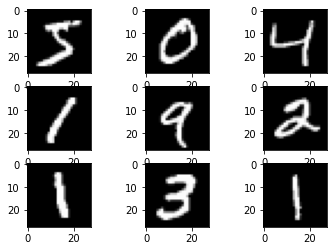

In [13]:
# load the mnist dataset
(X_train, y_train), (X_test, y_test) = mnist.load_data()

# look at the training/testing sizes
print('Train: X=%s, y=%s' % (X_train.shape, y_train.shape))
print('Test: X=%s, y=%s' % (X_test.shape, y_test.shape))

# plot the first nine images
for i in range(9):
    plt.subplot(330 + 1 + i)
    plt.imshow(X_train[i], cmap=plt.get_cmap('gray'))
plt.show()

In [17]:
# reshape training images
X_train = X_train.reshape((X_train.shape[0], 28, 28, 1))
X_test = X_test.reshape((X_test.shape[0], 28, 28, 1))
print(X_train.shape)

# one hot encode target values
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

(60000, 28, 28, 1)


In [25]:
# scale pixels
def prep_pixels(train, test):
    # convert from int to float
    train_norm = train.astype('float32')
    test_norm = test.astype('float32')
    # normalize to range 0-1
    train_norm = train_norm / 255.0
    test_norm = test_norm / 255.0
    # return normalized images
    return train_norm, test_norm
# convert images
X_train_norm, X_test_norm = prep_pixels(X_train, X_test)

In [26]:
# set-up model
model = Sequential()
# convolutional layer with a 3x3 kernel
model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', input_shape=(28,28,1)))
# pooling layer (takes the max value)
model.add(MaxPooling2D((2,2)))
model.add(Flatten())
# dense hidden layer
model.add(Dense(100, activation='relu', kernel_initializer='he_uniform'))
# output layer
model.add(Dense(10, activation='softmax'))
# compile model
opt = SGD(lr=0.01, momentum=0.9)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

In [27]:
model.fit(X_train_norm, y_train, epochs=5, batch_size=32, validation_data=(X_test_norm, y_test), verbose=0)

In [28]:
model.evaluate(X_test, y_test, verbose=0)

[39.42298126220703, 0.9538000226020813]

In [30]:
image_urls = ["https://raw.githubusercontent.com/bloominstituteoftechnology/data-science-canvas-images/main/unit_4/two_llamas.jpg",
          "https://raw.githubusercontent.com/bloominstituteoftechnology/data-science-canvas-images/main/unit_4/cat_llama.jpg",
          "https://raw.githubusercontent.com/bloominstituteoftechnology/data-science-canvas-images/main/unit_4/palm_trees.jpg"]

# write images to local file space
for _id, img in enumerate(image_urls):
    r = requests.get(img)
    with open(f'example{_id}.jpg', 'wb') as f:
        f.write(r.content)
        
# func to load images from a path
def process_img_path(img_path):
    return image.load_img(img_path, target_size=(224,224))


In [31]:
# determine if the image contains a llama
def img_contains_llama(img):
    # convert the image to an array
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    # instantiate the model
    model = ResNet50(weights='imagenet')
    # predict which features the image has
    features = model.predict(x)
    # decode the prediction and display the top three features
    results = decode_predictions(features, top=3)[0]
    print(results)

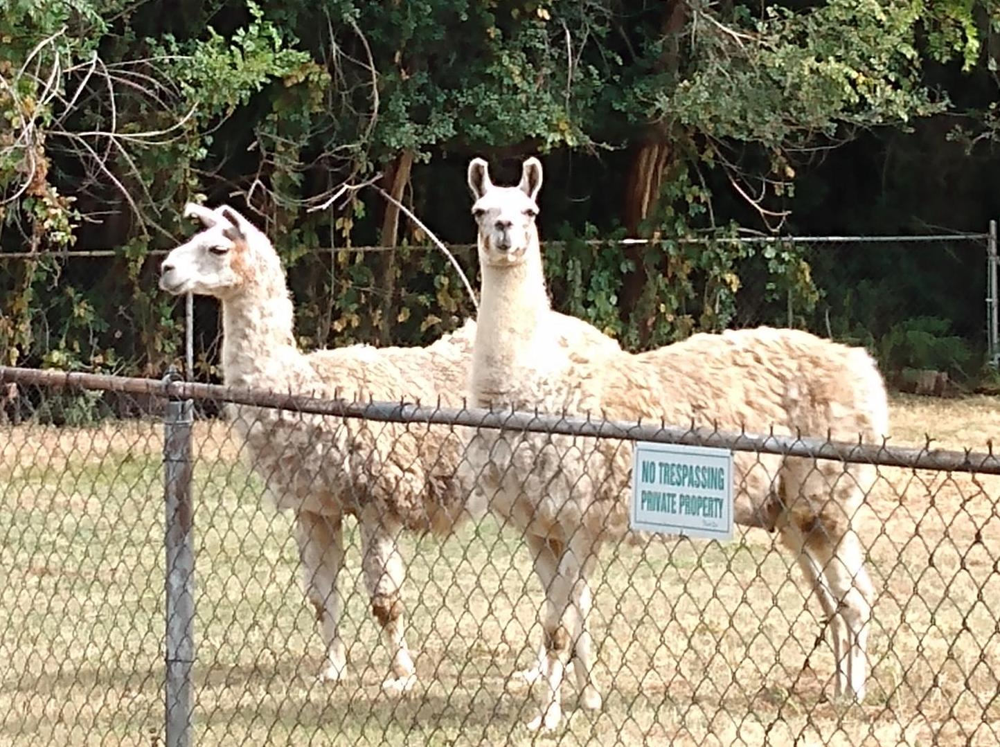

In [32]:
Image(filename='./example0.jpg', width=300)

In [33]:
img_contains_llama(process_img_path('example0.jpg'))

49152/35363 [=========================================] - 0s 1us/step
[('n02437616', 'llama', 0.9999949), ('n02437312', 'Arabian_camel', 4.216391e-06), ('n02412080', 'ram', 7.4659306e-07)]


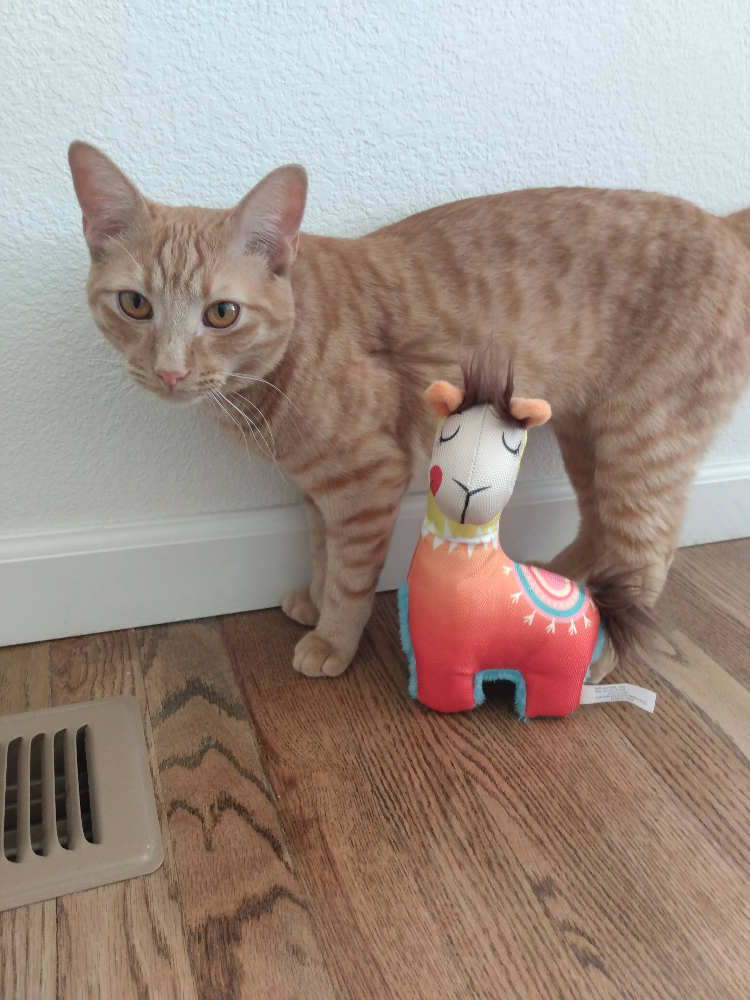

In [34]:
Image(filename='./example1.jpg', width=300)

In [35]:
img_contains_llama(process_img_path('example1.jpg'))

[('n02124075', 'Egyptian_cat', 0.6390665), ('n02123045', 'tabby', 0.13549393), ('n02123159', 'tiger_cat', 0.07188991)]


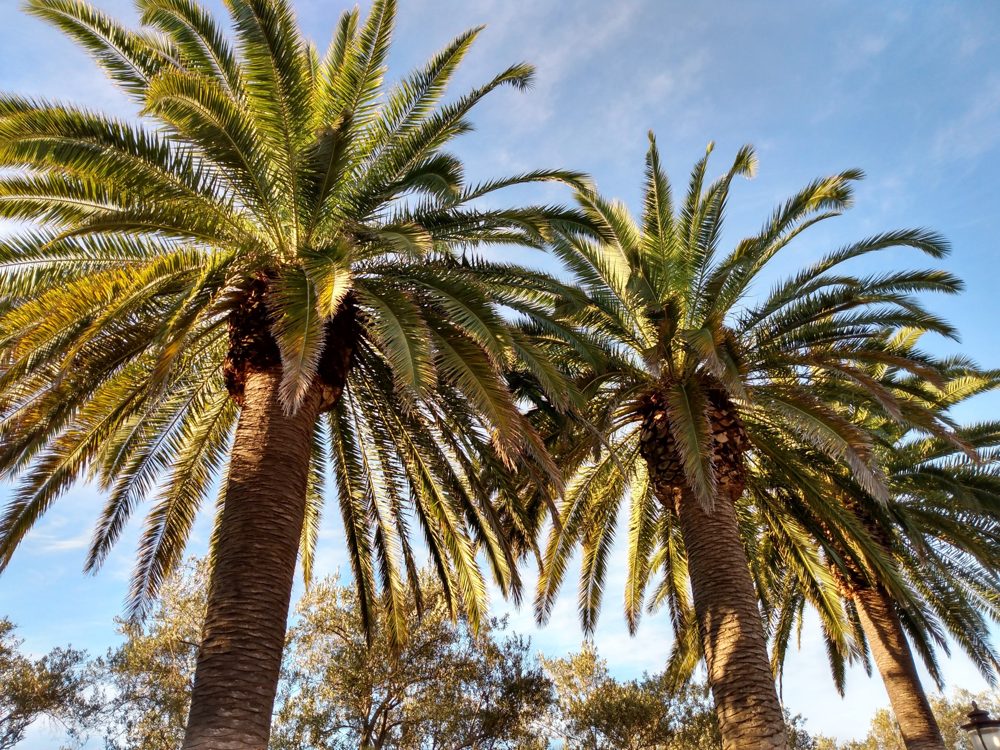

In [36]:
Image(filename='./example2.jpg', width=300)

In [37]:
img_contains_llama(process_img_path('example2.jpg'))

[('n09428293', 'seashore', 0.55565596), ('n03837869', 'obelisk', 0.09991887), ('n12768682', 'buckeye', 0.052723538)]
